# 🔍 Search and Rescue Person Detection with RetinaNet (Kaggle Edition)

**Goal:** Fine-tune a RetinaNet (ResNet-50 + FPN) model to detect humans in aerial/wilderness
imagery using the SARD (Search and Rescue Dataset).

**Why RetinaNet?**
- It's a **one-stage detector** — faster than two-stage detectors like Faster R-CNN
- Uses **Focal Loss** to handle the massive class imbalance in SAR images (vast background vs tiny person)
- **Feature Pyramid Network (FPN)** detects objects at multiple scales — critical for aerial images
  where humans can appear at vastly different sizes depending on altitude
- Available pretrained on COCO (80 classes including 'person') — great starting point

**Pipeline Overview:**
1. Environment setup (with Kaggle CUDA compatibility fix)
2. Download & explore the SARD dataset
3. Convert annotations to COCO format
4. Build data loaders with SAR-specific augmentations
5. Fine-tune RetinaNet with cosine annealing LR schedule
6. Evaluate with mAP, precision, recall
7. Run inference on new images + measure FPS

**Environment:** Kaggle with GPU (T4 or P100)

---
## 1. Environment Setup — CUDA Compatibility Fix

### Why this section exists
Kaggle sometimes has a **mismatch** between the pre-installed PyTorch CUDA version
and the actual GPU assigned to your session. This causes the cryptic error:
```
AcceleratorError: CUDA error: no kernel image is available for execution on the device
```

**What's happening:** PyTorch is compiled with CUDA kernels for specific GPU architectures
(called "compute capabilities"). If the PyTorch build doesn't include kernels for your
GPU's architecture, every CUDA operation fails.

**The fix:** We detect the GPU, check compatibility, and reinstall a matching PyTorch
version if needed. This cell handles it automatically.

In [6]:
# ============================================================
# 1.1  Diagnose and fix CUDA/PyTorch compatibility
# ============================================================
# This cell MUST run first. It detects your GPU and ensures
# PyTorch can actually execute CUDA kernels on it.
#
# Kaggle GPU types and their compute capabilities:
#   - T4      : compute 7.5 (most common)
#   - P100    : compute 6.0
#   - TPU     : not applicable (we need GPU)
# ============================================================
import subprocess
import sys

def diagnose_cuda():
    """Check CUDA setup and report any issues."""
    import torch

    print("=" * 60)
    print("CUDA DIAGNOSTICS")
    print("=" * 60)

    print(f"Python version  : {sys.version.split()[0]}")
    print(f"PyTorch version : {torch.__version__}")
    print(f"CUDA available  : {torch.cuda.is_available()}")

    if not torch.cuda.is_available():
        print("\n⚠️  No CUDA! Make sure GPU is enabled:")
        print("   Settings → Accelerator → GPU T4 x2 or GPU P100")
        return False

    print(f"CUDA version    : {torch.version.cuda}")
    print(f"GPU device      : {torch.cuda.get_device_name(0)}")
    print(f"GPU capability  : {torch.cuda.get_device_capability(0)}")
    print(f"cuDNN version   : {torch.backends.cudnn.version()}")

    # Actual compatibility test — try running a tiny CUDA operation
    try:
        x = torch.tensor([1.0, 2.0, 3.0], device="cuda")
        y = x * 2
        assert y.sum().item() == 12.0
        print(f"\n✅ CUDA basic ops    : WORKING")
    except Exception as e:
        print(f"\n❌ CUDA basic ops    : FAILED — {e}")
        return False

    # Test a convolution (this is what actually fails with the kernel error)
    try:
        conv = torch.nn.Conv2d(3, 16, 3, padding=1).cuda()
        dummy = torch.randn(1, 3, 32, 32).cuda()
        out = conv(dummy)
        print(f"✅ CUDA conv ops     : WORKING")
        return True
    except Exception as e:
        print(f"❌ CUDA conv ops     : FAILED — {e}")
        return False


cuda_ok = diagnose_cuda()

CUDA DIAGNOSTICS
Python version  : 3.12.12
PyTorch version : 2.10.0+cu128
CUDA available  : True
CUDA version    : 12.8
GPU device      : Tesla T4
GPU capability  : (7, 5)
cuDNN version   : 91002

✅ CUDA basic ops    : WORKING
✅ CUDA conv ops     : WORKING


In [7]:
# ============================================================
# 1.2  Fix PyTorch if CUDA test failed
# ============================================================
# If the diagnostic found a mismatch, we reinstall PyTorch
# with the correct CUDA version for this GPU.
#
# This takes 2-3 minutes but only needs to happen once per
# Kaggle session. Subsequent cells will use the fixed install.
#
# IMPORTANT: After this cell, you MUST restart the kernel:
#   Kernel → Restart & Run All (or the button at the top)
# ============================================================

if not cuda_ok:
    import torch
    print("🔧 Fixing PyTorch CUDA compatibility...\n")

    cuda_version = torch.version.cuda
    print(f"Detected CUDA version: {cuda_version}")

    # Determine the right PyTorch install command based on CUDA version
    if cuda_version and cuda_version.startswith("12"):
        cuda_tag = "cu121"
    elif cuda_version and cuda_version.startswith("11.8"):
        cuda_tag = "cu118"
    elif cuda_version and cuda_version.startswith("11"):
        cuda_tag = "cu118"  # Use 11.8 as fallback for 11.x
    else:
        cuda_tag = "cu121"  # Default to CUDA 12.1

    print(f"Installing PyTorch with {cuda_tag}...")
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        "torch", "torchvision", "torchaudio",
        "--index-url", f"https://download.pytorch.org/whl/{cuda_tag}"
    ])

    print("\n" + "=" * 60)
    print("⚠️  PyTorch was reinstalled. You MUST restart the kernel now!")
    print("   Go to: Kernel → Restart & Run All")
    print("   (The cuda_ok check will pass on the second run)")
    print("=" * 60)
else:
    print("\n✅ CUDA is working correctly — no fix needed!")


✅ CUDA is working correctly — no fix needed!


In [8]:
# ============================================================
# 1.3  Install additional dependencies
# ============================================================
# pycocotools  — official COCO evaluation metrics (mAP@0.5, etc.)
# albumentations — fast augmentation lib that auto-transforms bboxes
# ============================================================
!pip install -q pycocotools albumentations

# Final verification after any reinstalls
import torch
import torchvision
print(f"PyTorch      : {torch.__version__}")
print(f"TorchVision  : {torchvision.__version__}")
print(f"CUDA         : {torch.cuda.is_available()} ({torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'N/A'})")

# Smoke test — run the exact operation that was failing in the original error
try:
    t = torch.randn(1, 3, 64, 64, device="cuda")
    mean = torch.tensor([0.485, 0.456, 0.406], device="cuda")
    std = torch.tensor([0.229, 0.224, 0.225], device="cuda")
    result = (t - mean[:, None, None]) / std[:, None, None]
    print(f"Normalize op : ✅ PASS (this was the operation that crashed before)")
except Exception as e:
    print(f"Normalize op : ❌ FAIL — {e}")
    print("You may need to restart the kernel after cell 1.2")

PyTorch      : 2.10.0+cu128
TorchVision  : 0.25.0+cu128
CUDA         : True (Tesla T4)
Normalize op : ✅ PASS (this was the operation that crashed before)


In [9]:
# ============================================================
# 1.4  Import everything
# ============================================================
import os
import json
import glob
import time
import random
import shutil
import warnings
import gc
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2

import torch
import torch.utils.data as data
import torchvision
from torchvision.models.detection import retinanet_resnet50_fpn_v2
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

import albumentations as A
from albumentations.pytorch import ToTensorV2

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

warnings.filterwarnings("ignore")

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ============================================================
# Kaggle-specific environment settings
# ============================================================
# CUDA_LAUNCH_BLOCKING=1 makes CUDA errors report the correct
# line number (GPU ops are normally async, so errors appear on
# the wrong line). Small perf cost but invaluable for debugging.
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

# Kaggle paths — output goes to /kaggle/working/ (persisted after session)
KAGGLE_INPUT = Path("/kaggle/input")
KAGGLE_WORKING = Path("/kaggle/working")

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\n✅ All imports successful. Using: {DEVICE}")


✅ All imports successful. Using: cuda


---
## 2. Load the SARD Dataset

**Kaggle dataset access:** On Kaggle you add datasets via the sidebar:
1. Click **"+ Add Data"** in the right sidebar
2. Search for **"SARD Search and Rescue"**
3. Click **"Add"** — it mounts at `/kaggle/input/sard-search-and-rescue/`

This is much faster than downloading (the data is already on Kaggle's servers).

In [10]:
# ============================================================
# 2.1  Locate the dataset
# ============================================================
# Kaggle mounts datasets read-only under /kaggle/input/.
# The exact subfolder name matches the dataset slug on Kaggle.
# We search for it automatically in case the name varies.
# ============================================================

# Auto-discover the dataset path
dataset_path = None

# Method 1: Look for the known Kaggle dataset slug
candidate = KAGGLE_INPUT / "sard-search-and-rescue"
if candidate.exists():
    dataset_path = str(candidate)
    print(f"✅ Found dataset at: {dataset_path}")

# Method 2: Search /kaggle/input/ for any SAR-related dataset
if dataset_path is None:
    for d in KAGGLE_INPUT.iterdir():
        if d.is_dir() and ("sard" in d.name.lower() or "rescue" in d.name.lower()):
            dataset_path = str(d)
            print(f"✅ Found dataset at: {dataset_path}")
            break

# Method 3: Just use whatever is in /kaggle/input/
if dataset_path is None:
    input_dirs = [d for d in KAGGLE_INPUT.iterdir() if d.is_dir()]
    if input_dirs:
        dataset_path = str(input_dirs[0])
        print(f"⚠️  Using first available dataset: {dataset_path}")
    else:
        print("❌ No dataset found! Add the SARD dataset:")
        print("   1. Click '+ Add Data' in the right sidebar")
        print("   2. Search: 'SARD Search and Rescue'")
        print("   3. Click 'Add'")
        raise FileNotFoundError("No dataset in /kaggle/input/")

⚠️  Using first available dataset: /kaggle/input/datasets


In [11]:
# ============================================================
# 2.2  Explore the directory structure
# ============================================================
# Understanding the folder layout FIRST is essential:
#   - How are images organized? (flat? nested by class/split?)
#   - Where do annotations live? (XML? JSON? CSV? TXT?)
#   - Are there pre-made train/val/test splits?
# ============================================================

def explore_directory(path, indent=0, max_files=8):
    """Recursively print directory structure (limited depth)."""
    path = Path(path)
    entries = sorted(path.iterdir())
    dirs = [e for e in entries if e.is_dir()]
    files = [e for e in entries if e.is_file()]

    for d in dirs:
        file_count = len(list(d.rglob("*")))
        print(f"{'  ' * indent}📁 {d.name}/  ({file_count} items)")
        if indent < 2:
            explore_directory(d, indent + 1, max_files)

    for f in files[:max_files]:
        size_kb = f.stat().st_size / 1024
        print(f"{'  ' * indent}📄 {f.name}  ({size_kb:.1f} KB)")
    if len(files) > max_files:
        print(f"{'  ' * indent}... and {len(files) - max_files} more files")

explore_directory(dataset_path)

📁 nikolasgegenava/  (11524 items)
  📁 sard-search-and-rescue/  (11523 items)
    📁 search-and-rescue/  (11522 items)


In [12]:
# ============================================================
# 2.3  Discover all images and annotations
# ============================================================

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".tiff"}
ANNOT_EXTENSIONS = {".xml", ".txt", ".json", ".csv"}

all_images = []
all_annots = []

for root, dirs, files in os.walk(dataset_path):
    for f in files:
        ext = os.path.splitext(f)[1].lower()
        full_path = os.path.join(root, f)
        if ext in IMAGE_EXTENSIONS:
            all_images.append(full_path)
        elif ext in ANNOT_EXTENSIONS:
            all_annots.append(full_path)

print(f"Found {len(all_images)} images")
print(f"Found {len(all_annots)} annotation files")

# Show extension distribution
img_exts = Counter(os.path.splitext(f)[1].lower() for f in all_images)
ann_exts = Counter(os.path.splitext(f)[1].lower() for f in all_annots)
print(f"\nImage formats     : {dict(img_exts)}")
print(f"Annotation formats: {dict(ann_exts)}")

# Peek at a sample annotation
if all_annots:
    sample = all_annots[0]
    print(f"\n--- Sample annotation: {os.path.basename(sample)} ---")
    with open(sample, "r") as f:
        print(f.read()[:1500])

Found 5755 images
Found 5757 annotation files

Image formats     : {'.jpg': 5755}
Annotation formats: {'.txt': 5757}

--- Sample annotation: README.dataset.txt ---
# Sard > TILES_3x3
https://universe.roboflow.com/datasets-pdabr/sard-8xjhy

Provided by a Roboflow user
License: undefined




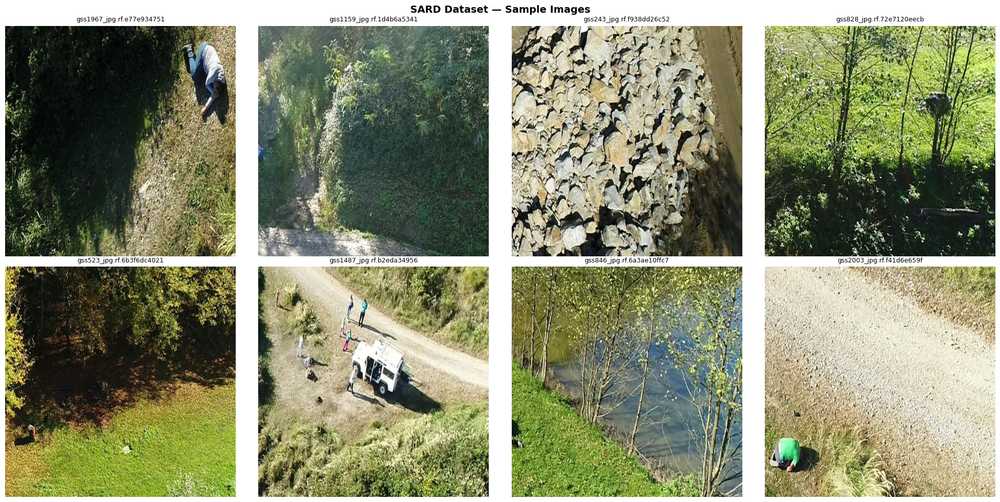

Width  — min: 640, max: 640, median: 640
Height — min: 640, max: 640, median: 640


In [13]:
# ============================================================
# 2.4  Visualize sample images
# ============================================================

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
sample_imgs = random.sample(all_images, min(8, len(all_images)))

for ax, img_path in zip(axes.flat, sample_imgs):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.set_title(os.path.basename(img_path)[:25], fontsize=9)
    ax.axis("off")

plt.suptitle("SARD Dataset — Sample Images", fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

# Image size distribution — important for choosing input resolution
sizes = []
for img_path in random.sample(all_images, min(200, len(all_images))):
    with Image.open(img_path) as img:
        sizes.append(img.size)

widths, heights = zip(*sizes)
print(f"Width  — min: {min(widths)}, max: {max(widths)}, median: {np.median(widths):.0f}")
print(f"Height — min: {min(heights)}, max: {max(heights)}, median: {np.median(heights):.0f}")

---
## 3. Parse Annotations & Convert to COCO Format

**Why COCO format?**
- `pycocotools` (gold-standard evaluation library) expects it
- torchvision detection models work natively with this format
- Most widely used format — makes your pipeline portable

**COCO format structure:**
```json
{
  "images": [{"id": 1, "file_name": "img.jpg", "width": 640, "height": 480}],
  "annotations": [{"id": 1, "image_id": 1, "category_id": 1,
                    "bbox": [x, y, width, height], "area": ..., "iscrowd": 0}],
  "categories": [{"id": 1, "name": "person"}]
}
```

The parser below handles **three annotation formats** SARD may use:
1. **Pascal VOC XML** — `<bndbox><xmin>...</xmin>...</bndbox>`
2. **YOLO TXT** — `class_id cx cy w h` (normalized 0-1)
3. **Already COCO JSON** — just load it

In [14]:
# ============================================================
# 3.1  Multi-format annotation parser
# ============================================================
# We build a universal parser rather than hard-coding one format.
# This makes the pipeline reusable for other SAR datasets.
# ============================================================
import xml.etree.ElementTree as ET


def parse_voc_xml(xml_path):
    """Parse Pascal VOC XML annotation.
    Returns list of dicts: [{"bbox": [x, y, w, h], "label": str}]
    bbox is COCO format: [top-left-x, top-left-y, width, height]
    """
    tree = ET.parse(xml_path)
    root = tree.getroot()
    boxes = []

    for obj in root.findall("object"):
        label = obj.find("name").text.lower().strip()
        bndbox = obj.find("bndbox")
        xmin = float(bndbox.find("xmin").text)
        ymin = float(bndbox.find("ymin").text)
        xmax = float(bndbox.find("xmax").text)
        ymax = float(bndbox.find("ymax").text)
        w = xmax - xmin
        h = ymax - ymin
        if w > 0 and h > 0:
            boxes.append({"bbox": [xmin, ymin, w, h], "label": label})

    return boxes


def parse_yolo_txt(txt_path, img_width, img_height):
    """Parse YOLO-format text annotation.
    YOLO: class_id center_x center_y width height (normalized 0-1)
    We convert to COCO absolute coords: [x, y, w, h]
    """
    boxes = []
    with open(txt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cx, cy, w, h = map(float, parts[1:5])
            abs_w = w * img_width
            abs_h = h * img_height
            abs_x = (cx * img_width) - (abs_w / 2)
            abs_y = (cy * img_height) - (abs_h / 2)
            if abs_w > 0 and abs_h > 0:
                boxes.append({"bbox": [abs_x, abs_y, abs_w, abs_h], "label": "person"})
    return boxes


print("✅ Annotation parsers ready")

✅ Annotation parsers ready


In [15]:
# ============================================================
# 3.2  Build the COCO-format annotation dictionary
# ============================================================
# We iterate over every image, find its annotation, parse it,
# and build a single unified COCO dict.
#
# KEY: We filter to keep only "person" / "human" labels.
# ============================================================

# Build lookup: filename_stem → annotation_path
annot_by_stem = {}
for a in all_annots:
    stem = Path(a).stem
    annot_by_stem[stem] = a

# Check for existing COCO JSONs
existing_coco_jsons = [a for a in all_annots if a.endswith(".json")]
print(f"Found {len(existing_coco_jsons)} JSON files")

PERSON_LABELS = {"person", "human", "people", "pedestrian", "man", "woman", "child"}


def build_coco_annotations(image_paths, annot_by_stem):
    """Build COCO-format annotation dict from images + annotations."""
    coco_dict = {
        "images": [],
        "annotations": [],
        "categories": [{"id": 1, "name": "person", "supercategory": "human"}],
    }

    annotation_id = 1
    skipped_no_annot = 0
    skipped_no_person = 0
    total_boxes = 0

    for img_id, img_path in enumerate(image_paths, start=1):
        try:
            with Image.open(img_path) as img:
                img_width, img_height = img.size
        except Exception:
            continue

        stem = Path(img_path).stem
        annot_path = annot_by_stem.get(stem, None)
        if annot_path is None:
            skipped_no_annot += 1
            continue

        ext = Path(annot_path).suffix.lower()
        if ext == ".xml":
            boxes = parse_voc_xml(annot_path)
        elif ext == ".txt":
            boxes = parse_yolo_txt(annot_path, img_width, img_height)
        else:
            continue

        person_boxes = [b for b in boxes if b["label"] in PERSON_LABELS]
        if ext == ".txt" and len(person_boxes) == 0:
            person_boxes = boxes  # YOLO files may not have label names

        if len(person_boxes) == 0:
            skipped_no_person += 1
            continue

        coco_dict["images"].append({
            "id": img_id,
            "file_name": img_path,
            "width": img_width,
            "height": img_height,
        })

        for box_info in person_boxes:
            x, y, w, h = box_info["bbox"]
            coco_dict["annotations"].append({
                "id": annotation_id,
                "image_id": img_id,
                "category_id": 1,
                "bbox": [round(x, 2), round(y, 2), round(w, 2), round(h, 2)],
                "area": round(w * h, 2),
                "iscrowd": 0,
            })
            annotation_id += 1
            total_boxes += 1

    print(f"\n📊 Annotation Summary:")
    print(f"   Images with annotations : {len(coco_dict['images'])}")
    print(f"   Total person bboxes     : {total_boxes}")
    print(f"   Skipped (no annotation) : {skipped_no_annot}")
    print(f"   Skipped (no person)     : {skipped_no_person}")
    print(f"   Avg persons per image   : {total_boxes / max(len(coco_dict['images']), 1):.1f}")

    return coco_dict


coco_data = build_coco_annotations(all_images, annot_by_stem)

Found 0 JSON files

📊 Annotation Summary:
   Images with annotations : 4923
   Total person bboxes     : 7424
   Skipped (no annotation) : 0
   Skipped (no person)     : 832
   Avg persons per image   : 1.5


In [16]:
# ============================================================
# 3.3  Handle pre-existing COCO JSON (alternative path)
# ============================================================

if existing_coco_jsons and len(coco_data["images"]) == 0:
    print("📌 No VOC/YOLO annotations but COCO JSONs exist. Loading...")

    for json_path in existing_coco_jsons:
        with open(json_path, "r") as f:
            candidate = json.load(f)

        if "images" in candidate and "annotations" in candidate:
            print(f"   ✅ Loaded {json_path}")
            print(f"      Images: {len(candidate['images'])}")
            print(f"      Annotations: {len(candidate['annotations'])}")
            coco_data = candidate

            # Fix relative file paths
            json_dir = os.path.dirname(json_path)
            for img_info in coco_data["images"]:
                fn = img_info["file_name"]
                if not os.path.isabs(fn):
                    for cand in [
                        os.path.join(json_dir, fn),
                        os.path.join(dataset_path, fn),
                    ]:
                        if os.path.exists(cand):
                            img_info["file_name"] = cand
                            break
            break

print(f"\n✅ Final dataset: {len(coco_data['images'])} images, {len(coco_data['annotations'])} annotations")


✅ Final dataset: 4923 images, 7424 annotations


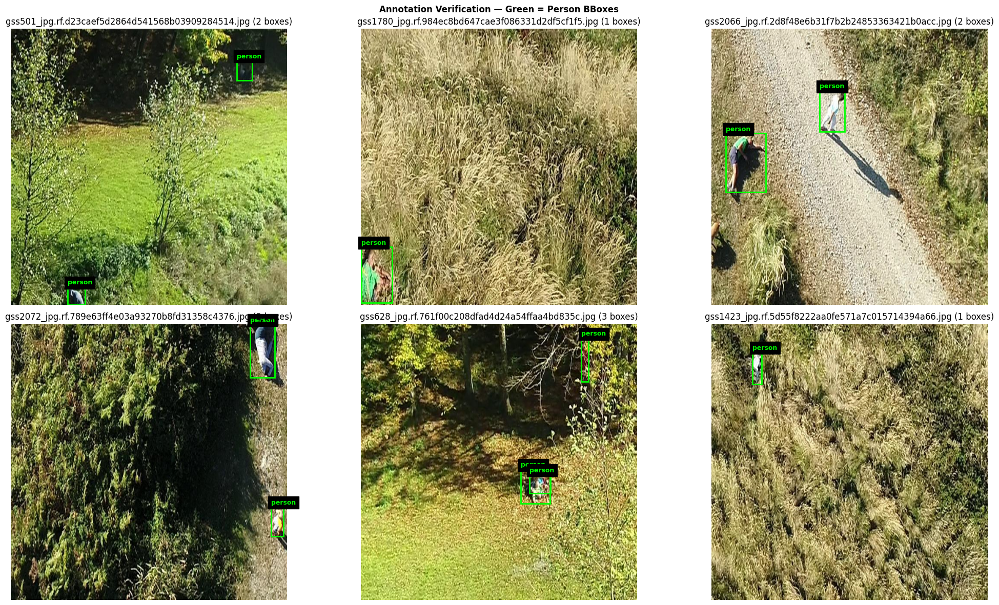

In [17]:
# ============================================================
# 3.4  Visualize annotations on images (sanity check)
# ============================================================

def visualize_coco_annotations(coco_dict, num_samples=6):
    """Draw bounding boxes on samples to verify annotation quality."""
    img_to_anns = defaultdict(list)
    for ann in coco_dict["annotations"]:
        img_to_anns[ann["image_id"]].append(ann)

    images_with_anns = [img for img in coco_dict["images"] if img["id"] in img_to_anns]
    samples = random.sample(images_with_anns, min(num_samples, len(images_with_anns)))

    cols = min(3, len(samples))
    rows = (len(samples) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 6 * rows))
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    axes = axes.flat

    for ax, img_info in zip(axes, samples):
        img = Image.open(img_info["file_name"])
        ax.imshow(img)
        for ann in img_to_anns[img_info["id"]]:
            x, y, w, h = ann["bbox"]
            rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                     edgecolor="lime", facecolor="none")
            ax.add_patch(rect)
            ax.text(x, y - 5, "person", color="lime", fontsize=9,
                    fontweight="bold", backgroundcolor="black")
        ax.set_title(f"{os.path.basename(img_info['file_name'])} ({len(img_to_anns[img_info['id']])} boxes)")
        ax.axis("off")

    for ax in list(axes)[len(samples):]:
        ax.axis("off")

    plt.suptitle("Annotation Verification — Green = Person BBoxes", fontweight="bold")
    plt.tight_layout()
    plt.show()


visualize_coco_annotations(coco_data)

📏 Bounding Box Size Distribution:
   Small  (< 32×32)  : 1106 (14.9%)
   Medium (32-96)    : 5270 (71.0%)
   Large  (> 96×96)  : 1048 (14.1%)

   Width  — min: 1, max: 322, median: 36
   Height — min: 2, max: 478, median: 82

👥 Persons Per Image: min=1, max=7, median=1


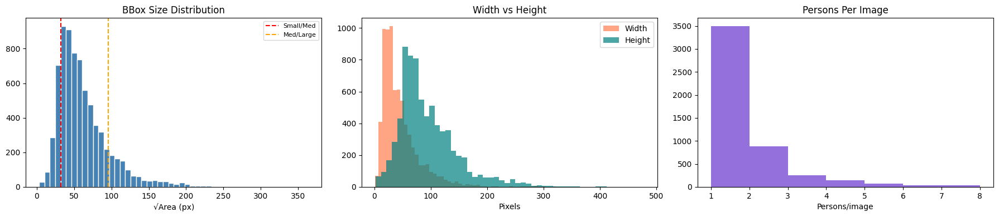

In [18]:
# ============================================================
# 3.5  Dataset statistics
# ============================================================

bbox_areas = [ann["area"] for ann in coco_data["annotations"]]
bbox_widths = [ann["bbox"][2] for ann in coco_data["annotations"]]
bbox_heights = [ann["bbox"][3] for ann in coco_data["annotations"]]

# COCO scale definitions: small < 32², medium 32²-96², large > 96²
small = sum(1 for a in bbox_areas if a < 32**2)
medium = sum(1 for a in bbox_areas if 32**2 <= a < 96**2)
large = sum(1 for a in bbox_areas if a >= 96**2)

print("📏 Bounding Box Size Distribution:")
print(f"   Small  (< 32×32)  : {small:4d} ({100*small/len(bbox_areas):.1f}%)")
print(f"   Medium (32-96)    : {medium:4d} ({100*medium/len(bbox_areas):.1f}%)")
print(f"   Large  (> 96×96)  : {large:4d} ({100*large/len(bbox_areas):.1f}%)")
print(f"\n   Width  — min: {min(bbox_widths):.0f}, max: {max(bbox_widths):.0f}, median: {np.median(bbox_widths):.0f}")
print(f"   Height — min: {min(bbox_heights):.0f}, max: {max(bbox_heights):.0f}, median: {np.median(bbox_heights):.0f}")

img_to_count = Counter(ann["image_id"] for ann in coco_data["annotations"])
counts = list(img_to_count.values())
print(f"\n👥 Persons Per Image: min={min(counts)}, max={max(counts)}, median={np.median(counts):.0f}")

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].hist(np.sqrt(bbox_areas), bins=50, color="steelblue", edgecolor="white")
axes[0].set_xlabel("√Area (px)"); axes[0].set_title("BBox Size Distribution")
axes[0].axvline(32, color="red", ls="--", label="Small/Med"); axes[0].axvline(96, color="orange", ls="--", label="Med/Large")
axes[0].legend(fontsize=8)
axes[1].hist(bbox_widths, bins=50, color="coral", alpha=0.7, label="Width")
axes[1].hist(bbox_heights, bins=50, color="teal", alpha=0.7, label="Height")
axes[1].set_xlabel("Pixels"); axes[1].set_title("Width vs Height"); axes[1].legend()
axes[2].hist(counts, bins=range(1, max(counts)+2), color="mediumpurple")
axes[2].set_xlabel("Persons/image"); axes[2].set_title("Persons Per Image")
plt.tight_layout(); plt.show()

In [19]:
# ============================================================
# 3.6  Train / Validation split
# ============================================================
# 85/15 split — SAR datasets are typically small, so we
# maximize training data while keeping enough for reliable mAP.
# Split by IMAGE to avoid data leakage.
# ============================================================

TRAIN_RATIO = 0.85

image_list = coco_data["images"].copy()
random.shuffle(image_list)

split_idx = int(len(image_list) * TRAIN_RATIO)
train_images = image_list[:split_idx]
val_images = image_list[split_idx:]

train_img_ids = {img["id"] for img in train_images}
val_img_ids = {img["id"] for img in val_images}

train_anns = [a for a in coco_data["annotations"] if a["image_id"] in train_img_ids]
val_anns = [a for a in coco_data["annotations"] if a["image_id"] in val_img_ids]

train_coco = {"images": train_images, "annotations": train_anns, "categories": coco_data["categories"]}
val_coco = {"images": val_images, "annotations": val_anns, "categories": coco_data["categories"]}

# Save to /kaggle/working/ (writable directory)
annot_dir = KAGGLE_WORKING / "coco_annotations"
annot_dir.mkdir(exist_ok=True)
with open(annot_dir / "train.json", "w") as f:
    json.dump(train_coco, f)
with open(annot_dir / "val.json", "w") as f:
    json.dump(val_coco, f)

print(f"📂 Train: {len(train_images)} images, {len(train_anns)} annotations")
print(f"📂 Val  : {len(val_images)} images, {len(val_anns)} annotations")

📂 Train: 4184 images, 6302 annotations
📂 Val  : 739 images, 1122 annotations


---
## 4. Dataset & DataLoader with SAR-Specific Augmentations

**Why augmentations matter even more for SAR:**
- SAR datasets are typically **small** → augmentations prevent overfitting
- Conditions vary wildly: fog, rain, snow, shadows, different altitudes

**Our augmentation choices (each simulates a real SAR condition):**

| Augmentation | Simulates |
|---|---|
| RandomResizedCrop | Different drone altitudes |
| HorizontalFlip | Orientation invariance |
| RandomBrightnessContrast | Time-of-day variation |
| HueSaturationValue | Seasonal vegetation |
| RandomFog / RandomShadow | Weather conditions |
| GaussNoise | Sensor noise at distance |
| CLAHE | Enhance hazy/foggy images |
| MotionBlur | Drone movement |

In [20]:
# ============================================================
# 4.1  Augmentation pipelines
# ============================================================
# INPUT_SIZE = 640: Balanced for Kaggle GPU VRAM
#   - 512 faster but misses small targets
#   - 800 better for small objects but needs more VRAM
#   - 640 is the sweet spot for T4/P100
#
# IMPORTANT DESIGN DECISION: We do NOT normalize here.
# torchvision's RetinaNet has its own internal normalization.
# Double-normalizing (once here + once inside model) causes
# the pixel values to be way off, hurting accuracy.
#
# Instead, we only convert to float [0,1] tensor. The model's
# GeneralizedRCNNTransform handles ImageNet normalization.
# ============================================================

INPUT_SIZE = 640


def get_train_transforms():
    """Training augmentations — aggressive but physically plausible for SAR."""
    return A.Compose(
        [
            # --- Spatial ---
            A.LongestMaxSize(max_size=INPUT_SIZE),
            A.PadIfNeeded(
                min_height=INPUT_SIZE, min_width=INPUT_SIZE,
                border_mode=cv2.BORDER_CONSTANT, value=0,
            ),
            A.HorizontalFlip(p=0.5),
            A.RandomResizedCrop(
                size=(INPUT_SIZE, INPUT_SIZE),
                scale=(0.6, 1.0), ratio=(0.8, 1.2), p=0.3,
            ),
            # --- Color/lighting ---
            A.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25, p=0.5),
            A.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=25, val_shift_limit=20, p=0.3),
            A.CLAHE(clip_limit=3.0, p=0.2),
            # --- SAR weather simulation ---
            A.RandomFog(fog_coef_lower=0.1, fog_coef_upper=0.3, p=0.15),
            A.RandomShadow(p=0.15),
            # --- Noise/blur ---
            A.GaussNoise(std_range=(0.01, 0.04), p=0.2),
            A.MotionBlur(blur_limit=5, p=0.15),
            # Convert to float tensor [0, 1] — NO normalization here!
            # RetinaNet's internal transform handles ImageNet normalization.
            ToTensorV2(),
        ],
        bbox_params=A.BboxParams(
            format="coco",
            label_fields=["labels"],
            min_area=16,
            min_visibility=0.3,
        ),
    )


def get_val_transforms():
    """Validation — deterministic, no randomness, no normalization."""
    return A.Compose(
        [
            A.LongestMaxSize(max_size=INPUT_SIZE),
            A.PadIfNeeded(
                min_height=INPUT_SIZE, min_width=INPUT_SIZE,
                border_mode=cv2.BORDER_CONSTANT, value=0,
            ),
            ToTensorV2(),
        ],
        bbox_params=A.BboxParams(
            format="coco",
            label_fields=["labels"],
            min_area=1,
            min_visibility=0.1,
        ),
    )


print("✅ Augmentation pipelines defined")
print("   NOTE: No A.Normalize() — the model handles normalization internally")

✅ Augmentation pipelines defined
   NOTE: No A.Normalize() — the model handles normalization internally


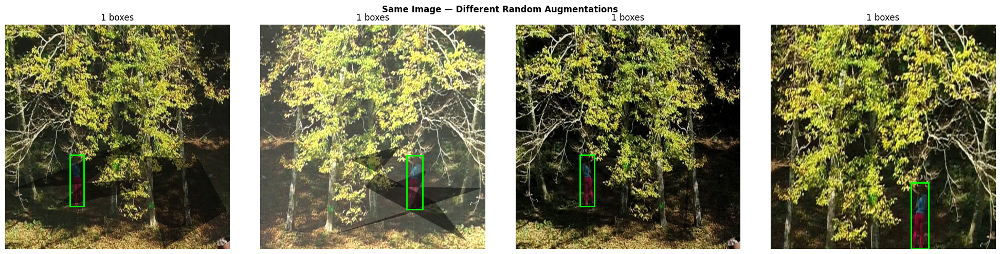

In [21]:
# ============================================================
# 4.2  Visualize augmentations
# ============================================================

def show_augmented_samples(coco_dict, transform, num_samples=4):
    img_to_anns = defaultdict(list)
    for ann in coco_dict["annotations"]:
        img_to_anns[ann["image_id"]].append(ann)

    img_info = random.choice(
        [img for img in coco_dict["images"] if img["id"] in img_to_anns]
    )
    image = cv2.imread(img_info["file_name"])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bboxes = [ann["bbox"] for ann in img_to_anns[img_info["id"]]]
    labels = [1] * len(bboxes)

    fig, axes = plt.subplots(1, num_samples, figsize=(5 * num_samples, 5))

    for ax in axes:
        augmented = transform(image=image.copy(), bboxes=bboxes, labels=labels)
        aug_img = augmented["image"]

        # ToTensorV2 gives [C,H,W] float — convert back for display
        display_img = aug_img.permute(1, 2, 0).numpy()
        if display_img.max() > 1.0:  # If uint8 range
            display_img = display_img / 255.0
        display_img = np.clip(display_img, 0, 1)

        ax.imshow(display_img)
        for bbox in augmented["bboxes"]:
            x, y, w, h = bbox
            rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                     edgecolor="lime", facecolor="none")
            ax.add_patch(rect)
        ax.set_title(f"{len(augmented['bboxes'])} boxes")
        ax.axis("off")

    plt.suptitle("Same Image — Different Random Augmentations", fontweight="bold")
    plt.tight_layout(); plt.show()


show_augmented_samples(train_coco, get_train_transforms())

In [22]:
# ============================================================
# 4.3  PyTorch Dataset class
# ============================================================
# torchvision detection models expect:
#   - image: FloatTensor [C, H, W] in range [0, 1]
#   - target: dict with:
#       "boxes"  : FloatTensor [N, 4] as [x1, y1, x2, y2]
#       "labels" : Int64Tensor [N]
#
# CRITICAL: torchvision uses corner format [x1,y1,x2,y2],
# NOT COCO's [x,y,w,h]. We convert in __getitem__.
# ============================================================


class SARDataset(data.Dataset):
    """
    PyTorch Dataset for SAR person detection.
    Returns data in torchvision detection format.
    """

    def __init__(self, coco_dict, transforms=None):
        self.transforms = transforms
        self.images = coco_dict["images"]
        self.img_to_anns = defaultdict(list)
        for ann in coco_dict["annotations"]:
            self.img_to_anns[ann["image_id"]].append(ann)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_info = self.images[idx]

        # Load image as RGB numpy array
        image = cv2.imread(img_info["file_name"])
        if image is None:
            raise FileNotFoundError(f"Cannot read: {img_info['file_name']}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Load annotations
        anns = self.img_to_anns[img_info["id"]]
        bboxes = [ann["bbox"] for ann in anns]
        labels = [ann["category_id"] for ann in anns]

        # Apply augmentations
        if self.transforms:
            augmented = self.transforms(image=image, bboxes=bboxes, labels=labels)
            image = augmented["image"]       # Tensor [C, H, W]
            bboxes = augmented["bboxes"]
            labels = augmented["labels"]

        # Ensure image is float32 in [0, 1]
        if image.dtype == torch.uint8:
            image = image.float() / 255.0
        elif image.dtype != torch.float32:
            image = image.float()

        # Convert COCO [x,y,w,h] → torchvision [x1,y1,x2,y2]
        if len(bboxes) > 0:
            boxes_tensor = torch.tensor(bboxes, dtype=torch.float32)
            boxes_xyxy = torch.zeros_like(boxes_tensor)
            boxes_xyxy[:, 0] = boxes_tensor[:, 0]                       # x1
            boxes_xyxy[:, 1] = boxes_tensor[:, 1]                       # y1
            boxes_xyxy[:, 2] = boxes_tensor[:, 0] + boxes_tensor[:, 2]  # x2
            boxes_xyxy[:, 3] = boxes_tensor[:, 1] + boxes_tensor[:, 3]  # y2
        else:
            boxes_xyxy = torch.zeros((0, 4), dtype=torch.float32)

        target = {
            "boxes": boxes_xyxy,
            "labels": torch.tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor([img_info["id"]]),
        }

        return image, target


def collate_fn(batch):
    """Custom collate: images stay as list (variable box counts per image)."""
    return list(zip(*batch))


print("✅ SARDataset class defined")

✅ SARDataset class defined


In [23]:
# ============================================================
# 4.4  Create DataLoaders
# ============================================================
# BATCH_SIZE = 4: Works on both T4 (16GB) and P100 (16GB)
# NUM_WORKERS = 2: Kaggle has 4 CPU cores, 2 workers is safe
# ============================================================

BATCH_SIZE = 4
NUM_WORKERS = 2

train_dataset = SARDataset(train_coco, transforms=get_train_transforms())
val_dataset = SARDataset(val_coco, transforms=get_val_transforms())

train_loader = data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    collate_fn=collate_fn, num_workers=NUM_WORKERS,
    pin_memory=True, drop_last=True,
)
val_loader = data.DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    collate_fn=collate_fn, num_workers=NUM_WORKERS,
    pin_memory=True,
)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches  : {len(val_loader)}")

# Quick test — verify data pipeline end-to-end
test_imgs, test_targets = next(iter(train_loader))
print(f"\n✅ Batch test passed!")
print(f"   Image shape  : {test_imgs[0].shape}")
print(f"   Image dtype  : {test_imgs[0].dtype}")
print(f"   Image range  : [{test_imgs[0].min():.3f}, {test_imgs[0].max():.3f}]")
print(f"   Boxes shape  : {test_targets[0]['boxes'].shape}")
print(f"   Labels       : {test_targets[0]['labels']}")

Train batches: 1046
Val batches  : 185

✅ Batch test passed!
   Image shape  : torch.Size([3, 640, 640])
   Image dtype  : torch.float32
   Image range  : [0.000, 1.000]
   Boxes shape  : torch.Size([4, 4])
   Labels       : tensor([1, 1, 1, 1])


---
## 5. Build the RetinaNet Model

**Architecture:**
```
Input Image (640×640, float32, [0-1])
    │
    ▼
Internal Transform (ImageNet normalize + resize)
    │
    ▼
ResNet-50 Backbone (pretrained on ImageNet)
    │ → extracts features at multiple scales
    ▼
Feature Pyramid Network (FPN)
    │ → merges multi-scale features (P3-P7)
    │ → detects both tiny distant and close humans
    ▼
Classification Head → person or background? (Focal Loss)
Regression Head    → where exactly? (Smooth L1 Loss)
```

**Modification:** Replace 80-class head with 1-class (person only).

In [24]:
# ============================================================
# 5.1  Load pretrained RetinaNet and modify for single class
# ============================================================
# We load full COCO-pretrained weights (not just ImageNet
# backbone). COCO already has 'person' — great starting point.
#
# Backbone freezing: auto-decided by dataset size.
#   < 500 images → freeze (prevent overfitting)
#   ≥ 500 images → unfreeze (let backbone adapt)
# ============================================================

def build_retinanet(num_classes=2, freeze_backbone=False):
    """
    Build RetinaNet with single-class output.

    Args:
        num_classes: 2 = background (0) + person (1)
            torchvision counts background as a class.
        freeze_backbone: Freeze ResNet-50 weights.
    """
    # Try V2 first (improved anchors + training recipe)
    # Fall back to V1 if V2 unavailable (older torchvision)
    try:
        from torchvision.models.detection import (
            retinanet_resnet50_fpn_v2,
            RetinaNet_ResNet50_FPN_V2_Weights,
        )
        model = retinanet_resnet50_fpn_v2(
            weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
        )
        print("✅ Loaded RetinaNet V2 (improved version)")
    except (ImportError, AttributeError):
        from torchvision.models.detection import retinanet_resnet50_fpn
        model = retinanet_resnet50_fpn(pretrained=True)
        print("✅ Loaded RetinaNet V1 (fallback — V2 not available)")

    # Replace classification head: 80 COCO classes → 1 class
    num_anchors = model.head.classification_head.num_anchors
    in_channels = model.backbone.out_channels  # 256 for FPN

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=in_channels,
        num_anchors=num_anchors,
        num_classes=num_classes,
    )

    if freeze_backbone:
        for param in model.backbone.parameters():
            param.requires_grad = False
        print("🔒 Backbone frozen")
    else:
        print("🔓 Full model trainable")

    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"   Total params     : {total:,}")
    print(f"   Trainable params : {trainable:,}")

    return model


num_train_images = len(train_coco["images"])
freeze = num_train_images < 500
print(f"Training images: {num_train_images} → {'Freezing' if freeze else 'Not freezing'} backbone\n")

model = build_retinanet(num_classes=2, freeze_backbone=freeze)
model.to(DEVICE)

# ============================================================
# CUDA SANITY CHECK: Run a quick forward pass to catch errors
# BEFORE training (fail fast, don't waste 20 min then crash)
# ============================================================
print("\n🧪 Running CUDA sanity check...")
model.eval()
with torch.no_grad():
    dummy = torch.randn(1, 3, 256, 256).to(DEVICE)
    try:
        out = model([dummy[0]])
        print(f"   Forward pass: ✅ PASS ({len(out[0]['boxes'])} boxes detected on noise)")
    except Exception as e:
        print(f"   Forward pass: ❌ FAIL — {e}")
        print("   Go back to Section 1 and fix the CUDA issue first!")
        raise

# Also check training mode (loss computation)
model.train()
try:
    test_img = test_imgs[0].to(DEVICE)
    test_tgt = {k: v.to(DEVICE) for k, v in test_targets[0].items()}
    if test_tgt["boxes"].shape[0] > 0:
        loss = model([test_img], [test_tgt])
        print(f"   Training loss: ✅ PASS (cls={loss['classification'].item():.4f}, reg={loss['bbox_regression'].item():.4f})")
    else:
        print(f"   Training loss: ⚠️ Skipped (test batch had no boxes)")
except Exception as e:
    print(f"   Training loss: ❌ FAIL — {e}")
    raise

print(f"\n✅ Model ready on {DEVICE}")

Training images: 4184 → Not freezing backbone

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth


100%|██████████| 146M/146M [00:00<00:00, 220MB/s] 


✅ Loaded RetinaNet V2 (improved version)
🔓 Full model trainable
   Total params     : 36,351,606
   Trainable params : 36,126,262

🧪 Running CUDA sanity check...
   Forward pass: ✅ PASS (33 boxes detected on noise)
   Training loss: ✅ PASS (cls=1.1343, reg=0.2702)

✅ Model ready on cuda


---
## 6. Training Pipeline

**LR Schedule: Cosine Annealing** (smooth decay, no sudden drops)

Why it beats StepLR for fine-tuning:
- Smooth decay → no abrupt LR drops that destabilize small-dataset training
- Lower final LR → sharper minima = better generalization
- StepLR drops are arbitrary; cosine follows a natural curve

In [25]:
# ============================================================
# 6.1  Hyperparameters
# ============================================================
# Tuned for SAR fine-tuning on Kaggle GPU.
# ============================================================

NUM_EPOCHS = 25
LEARNING_RATE = 0.005   # Higher than typical; cosine annealing decays it smoothly
WEIGHT_DECAY = 0.0005   # L2 regularization against overfitting
WARMUP_EPOCHS = 2       # Linear warmup prevents early divergence at LR=0.005

# SGD with momentum — generalizes better than AdamW on small datasets
optimizer = torch.optim.SGD(
    [p for p in model.parameters() if p.requires_grad],
    lr=LEARNING_RATE, momentum=0.9, weight_decay=WEIGHT_DECAY,
)

# Cosine annealing with warm restarts
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer,
    T_0=NUM_EPOCHS - WARMUP_EPOCHS,
    T_mult=1,
    eta_min=1e-6,
)

print(f"Optimizer : SGD (lr={LEARNING_RATE}, momentum=0.9, wd={WEIGHT_DECAY})")
print(f"Scheduler : CosineAnnealing (T_0={NUM_EPOCHS - WARMUP_EPOCHS})")
print(f"Epochs    : {NUM_EPOCHS} ({WARMUP_EPOCHS} warmup + {NUM_EPOCHS - WARMUP_EPOCHS} cosine)")

Optimizer : SGD (lr=0.005, momentum=0.9, wd=0.0005)
Scheduler : CosineAnnealing (T_0=23)
Epochs    : 25 (2 warmup + 23 cosine)


In [26]:
# ============================================================
# 6.2  Training & validation functions
# ============================================================
# RetinaNet in torchvision is self-contained:
#   - Train mode: model(images, targets) → loss dict
#   - Eval mode:  model(images) → detections
#
# Focal Loss (for classification) is built-in — it down-weights
# easy negatives (background) and focuses on hard cases.
# ============================================================


def warmup_lr(optimizer, epoch, warmup_epochs, target_lr):
    """Linear warmup: LR from ~0 to target over warmup_epochs."""
    lr = target_lr * (epoch + 1) / warmup_epochs
    for pg in optimizer.param_groups:
        pg["lr"] = lr
    return lr


def train_one_epoch(model, loader, optimizer, device, epoch):
    """Train one epoch, return average losses."""
    model.train()
    total_loss = total_cls = total_reg = 0.0
    num_batches = 0

    for batch_idx, (images, targets) in enumerate(loader):
        # Move to GPU
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Skip empty batches (all boxes lost to augmentation)
        if all(t["boxes"].shape[0] == 0 for t in targets):
            continue

        # Forward → loss
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backward
        optimizer.zero_grad()
        losses.backward()
        torch.nn.utils.clip_grad_norm_(
            [p for p in model.parameters() if p.requires_grad], max_norm=10.0
        )
        optimizer.step()

        total_loss += losses.item()
        total_cls += loss_dict["classification"].item()
        total_reg += loss_dict["bbox_regression"].item()
        num_batches += 1

        if (batch_idx + 1) % 20 == 0:
            print(f"  Batch {batch_idx+1}/{len(loader)} | "
                  f"Loss: {losses.item():.4f} (cls: {loss_dict['classification'].item():.4f}, "
                  f"reg: {loss_dict['bbox_regression'].item():.4f})")

    n = max(num_batches, 1)
    return total_loss / n, total_cls / n, total_reg / n


@torch.no_grad()
def validate(model, loader, device):
    """Compute validation loss."""
    model.train()  # Need train mode to get losses
    total_loss = 0.0
    num_batches = 0

    for images, targets in loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if all(t["boxes"].shape[0] == 0 for t in targets):
            continue
        loss_dict = model(images, targets)
        total_loss += sum(l.item() for l in loss_dict.values())
        num_batches += 1

    return total_loss / max(num_batches, 1)


print("✅ Training functions defined")

✅ Training functions defined


In [27]:
# ============================================================
# 6.3  Main training loop
# ============================================================
# Features:
#   - Linear warmup → cosine annealing
#   - Val loss tracking
#   - Best model checkpointing
#   - VRAM cleanup each epoch (Kaggle sometimes has tight memory)
# ============================================================

history = {"epoch": [], "train_loss": [], "train_cls_loss": [],
           "train_reg_loss": [], "val_loss": [], "lr": []}

best_val_loss = float("inf")
best_epoch = 0
ckpt_dir = KAGGLE_WORKING / "checkpoints"
ckpt_dir.mkdir(exist_ok=True)

print("=" * 70)
print("TRAINING START")
print("=" * 70)

for epoch in range(NUM_EPOCHS):
    epoch_start = time.time()

    # --- LR Schedule ---
    if epoch < WARMUP_EPOCHS:
        current_lr = warmup_lr(optimizer, epoch, WARMUP_EPOCHS, LEARNING_RATE)
    else:
        scheduler.step(epoch - WARMUP_EPOCHS)
        current_lr = optimizer.param_groups[0]["lr"]

    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS} | LR: {current_lr:.6f}")
    print("-" * 50)

    # --- Train ---
    train_loss, cls_loss, reg_loss = train_one_epoch(
        model, train_loader, optimizer, DEVICE, epoch
    )

    # --- Validate ---
    val_loss = validate(model, val_loader, DEVICE)

    # --- Checkpoint ---
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_epoch = epoch + 1
        torch.save(model.state_dict(), ckpt_dir / "best_model.pth")
        marker = " ⭐ BEST"
    else:
        marker = ""

    # --- Log ---
    elapsed = time.time() - epoch_start
    history["epoch"].append(epoch + 1)
    history["train_loss"].append(train_loss)
    history["train_cls_loss"].append(cls_loss)
    history["train_reg_loss"].append(reg_loss)
    history["val_loss"].append(val_loss)
    history["lr"].append(current_lr)

    print(f"  Train: {train_loss:.4f} (cls: {cls_loss:.4f}, reg: {reg_loss:.4f}) | "
          f"Val: {val_loss:.4f} | {elapsed:.0f}s{marker}")

    # Clean up VRAM — helps with Kaggle's tighter memory
    torch.cuda.empty_cache()
    gc.collect()

# Save final model
torch.save(model.state_dict(), ckpt_dir / "final_model.pth")

print(f"\n{'='*70}")
print(f"TRAINING COMPLETE — Best val loss: {best_val_loss:.4f} at epoch {best_epoch}")
print(f"{'='*70}")

TRAINING START

Epoch 1/25 | LR: 0.002500
--------------------------------------------------
  Batch 20/1046 | Loss: 1.5328 (cls: 1.0508, reg: 0.4820)
  Batch 40/1046 | Loss: 0.9571 (cls: 0.7727, reg: 0.1844)
  Batch 60/1046 | Loss: 1.0145 (cls: 0.8446, reg: 0.1698)
  Batch 80/1046 | Loss: 0.8940 (cls: 0.6326, reg: 0.2613)
  Batch 100/1046 | Loss: 0.9001 (cls: 0.5698, reg: 0.3303)
  Batch 120/1046 | Loss: 0.7991 (cls: 0.6462, reg: 0.1529)
  Batch 140/1046 | Loss: 1.0867 (cls: 0.7162, reg: 0.3705)
  Batch 160/1046 | Loss: 0.5356 (cls: 0.3126, reg: 0.2230)
  Batch 180/1046 | Loss: 0.7743 (cls: 0.4816, reg: 0.2927)
  Batch 200/1046 | Loss: 0.7075 (cls: 0.3824, reg: 0.3251)
  Batch 220/1046 | Loss: 0.7048 (cls: 0.4789, reg: 0.2259)
  Batch 240/1046 | Loss: 0.5131 (cls: 0.3259, reg: 0.1872)
  Batch 260/1046 | Loss: 0.5096 (cls: 0.2807, reg: 0.2289)
  Batch 280/1046 | Loss: 0.4586 (cls: 0.2314, reg: 0.2271)
  Batch 300/1046 | Loss: 0.4264 (cls: 0.2696, reg: 0.1568)
  Batch 320/1046 | Loss: 0

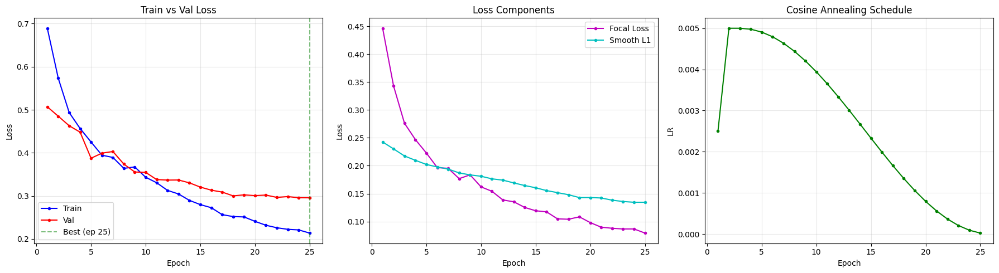

In [28]:
# ============================================================
# 6.4  Plot training curves
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(history["epoch"], history["train_loss"], "b-o", label="Train", ms=3)
axes[0].plot(history["epoch"], history["val_loss"], "r-o", label="Val", ms=3)
axes[0].axvline(best_epoch, color="green", ls="--", alpha=0.5, label=f"Best (ep {best_epoch})")
axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
axes[0].set_title("Train vs Val Loss"); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].plot(history["epoch"], history["train_cls_loss"], "m-o", label="Focal Loss", ms=3)
axes[1].plot(history["epoch"], history["train_reg_loss"], "c-o", label="Smooth L1", ms=3)
axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Loss")
axes[1].set_title("Loss Components"); axes[1].legend(); axes[1].grid(True, alpha=0.3)

axes[2].plot(history["epoch"], history["lr"], "g-o", ms=3)
axes[2].set_xlabel("Epoch"); axes[2].set_ylabel("LR")
axes[2].set_title("Cosine Annealing Schedule"); axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(KAGGLE_WORKING / "training_curves.png", dpi=150, bbox_inches="tight")
plt.show()

---
## 7. Evaluation with COCO Metrics

| Metric | What it measures |
|---|---|
| mAP@0.50 | Detections with ≥50% IoU overlap |
| mAP@0.50:0.95 | Average across IoU 0.50→0.95 (stricter) |
| AP (small) | Small objects < 32×32 px — critical for SAR |
| Recall | Of all real persons, how many did we find? |

**For SAR, recall > precision:** A false positive wastes time,
but a false negative (missing a person) could cost a life.

In [29]:
# ============================================================
# 7.1  Load best model and generate predictions
# ============================================================

model.load_state_dict(torch.load(ckpt_dir / "best_model.pth", map_location=DEVICE))
model.eval()
print(f"✅ Loaded best model from epoch {best_epoch}")


@torch.no_grad()
def generate_predictions(model, loader, device, score_threshold=0.3):
    """Run inference on val set, collect predictions in COCO format."""
    model.eval()
    all_preds = []

    for images, targets in loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        for output, target in zip(outputs, targets):
            img_id = target["image_id"].item()
            for box, score, label in zip(
                output["boxes"].cpu().numpy(),
                output["scores"].cpu().numpy(),
                output["labels"].cpu().numpy(),
            ):
                if score < score_threshold:
                    continue
                x1, y1, x2, y2 = box
                all_preds.append({
                    "image_id": img_id,
                    "category_id": int(label),
                    "bbox": [float(x1), float(y1), float(x2-x1), float(y2-y1)],
                    "score": float(score),
                })

    return all_preds


print("Running inference on validation set...")
predictions = generate_predictions(model, val_loader, DEVICE)
print(f"Generated {len(predictions)} predictions")

✅ Loaded best model from epoch 25
Running inference on validation set...
Generated 1075 predictions


In [30]:
# ============================================================
# 7.2  Official COCO evaluation
# ============================================================

if len(predictions) > 0:
    pred_path = KAGGLE_WORKING / "predictions.json"
    with open(pred_path, "w") as f:
        json.dump(predictions, f)

    coco_gt = COCO(str(annot_dir / "val.json"))
    coco_dt = coco_gt.loadRes(str(pred_path))

    coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    metrics = {
        "mAP@0.50:0.95": coco_eval.stats[0],
        "mAP@0.50": coco_eval.stats[1],
        "mAP@0.75": coco_eval.stats[2],
        "AP_small": coco_eval.stats[3],
        "AP_medium": coco_eval.stats[4],
        "AP_large": coco_eval.stats[5],
        "AR@1": coco_eval.stats[6],
        "AR@10": coco_eval.stats[7],
        "AR@100": coco_eval.stats[8],
    }

    print("\n" + "=" * 50)
    print("📊 Key Metrics")
    print("=" * 50)
    for name, val in metrics.items():
        bar = "█" * int(val * 40)
        print(f"  {name:20s}: {val:.4f} {bar}")
else:
    print("⚠️ No predictions — check model and data")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.23s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.897
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.681
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.307
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.615
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.746
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.455
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

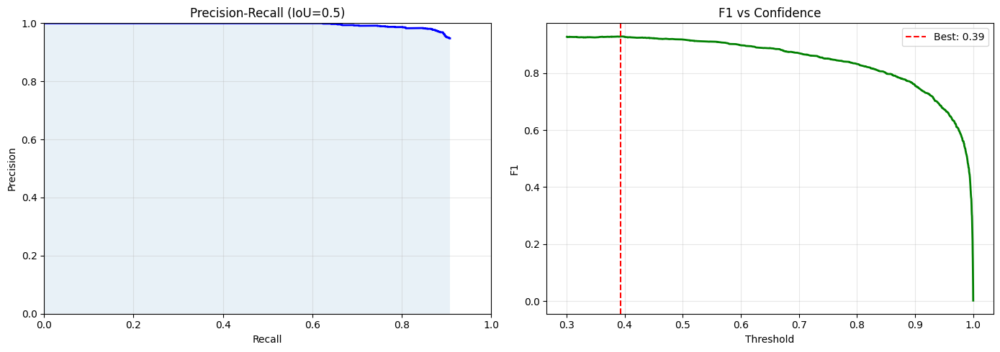


🎯 Optimal threshold: 0.393
   P=0.969, R=0.892, F1=0.929


In [31]:
# ============================================================
# 7.3  Precision-Recall curve
# ============================================================

def compute_iou(box1, box2):
    """IoU between two [x,y,w,h] boxes."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[0]+box1[2], box2[0]+box2[2])
    y2 = min(box1[1]+box1[3], box2[1]+box2[3])
    inter = max(0, x2-x1) * max(0, y2-y1)
    union = box1[2]*box1[3] + box2[2]*box2[3] - inter
    return inter / (union + 1e-6)


def precision_recall_curve(preds, gt_dict, iou_thresh=0.5):
    gt_by_img = defaultdict(list)
    for ann in gt_dict["annotations"]:
        gt_by_img[ann["image_id"]].append(ann["bbox"])

    total_gt = len(gt_dict["annotations"])
    sorted_preds = sorted(preds, key=lambda x: x["score"], reverse=True)

    tp_list, fp_list = [], []
    matched = defaultdict(set)

    for pred in sorted_preds:
        img_id = pred["image_id"]
        best_iou, best_idx = 0, -1
        for i, gt_box in enumerate(gt_by_img[img_id]):
            if i in matched[img_id]:
                continue
            iou = compute_iou(pred["bbox"], gt_box)
            if iou > best_iou:
                best_iou, best_idx = iou, i

        if best_iou >= iou_thresh:
            tp_list.append(1); fp_list.append(0)
            matched[img_id].add(best_idx)
        else:
            tp_list.append(0); fp_list.append(1)

    tp_cum = np.cumsum(tp_list)
    fp_cum = np.cumsum(fp_list)
    precision = tp_cum / (tp_cum + fp_cum)
    recall = tp_cum / total_gt
    return precision, recall, [p["score"] for p in sorted_preds]


if len(predictions) > 0:
    prec, rec, scores = precision_recall_curve(predictions, val_coco)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].plot(rec, prec, "b-", lw=2)
    axes[0].fill_between(rec, prec, alpha=0.1)
    axes[0].set_xlabel("Recall"); axes[0].set_ylabel("Precision")
    axes[0].set_title("Precision-Recall (IoU=0.5)")
    axes[0].set_xlim([0,1]); axes[0].set_ylim([0,1]); axes[0].grid(True, alpha=0.3)

    f1 = 2 * prec * rec / (prec + rec + 1e-6)
    best_idx = np.argmax(f1)
    axes[1].plot(scores, f1, "g-", lw=2)
    axes[1].axvline(scores[best_idx], color="red", ls="--",
                    label=f"Best: {scores[best_idx]:.2f}")
    axes[1].set_xlabel("Threshold"); axes[1].set_ylabel("F1")
    axes[1].set_title("F1 vs Confidence"); axes[1].legend(); axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(KAGGLE_WORKING / "pr_curve.png", dpi=150, bbox_inches="tight")
    plt.show()

    print(f"\n🎯 Optimal threshold: {scores[best_idx]:.3f}")
    print(f"   P={prec[best_idx]:.3f}, R={rec[best_idx]:.3f}, F1={f1[best_idx]:.3f}")

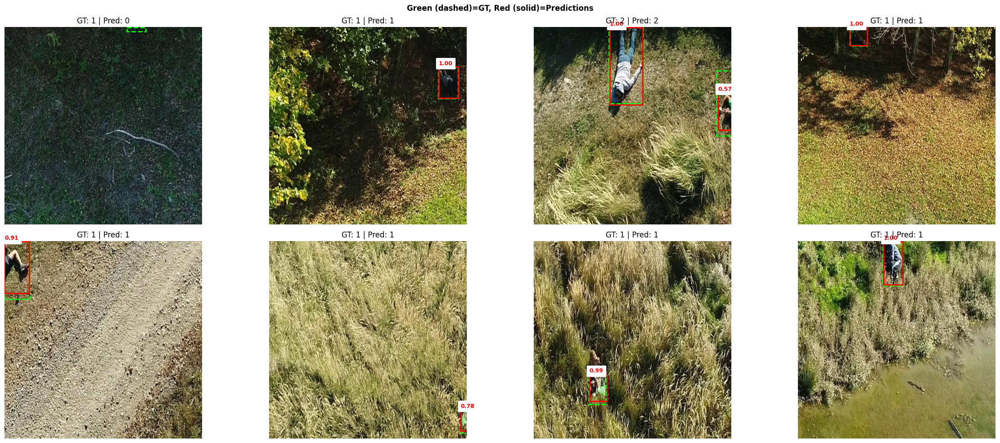

In [38]:
# ============================================================
# 7.4  Visualize detections on val images
# ============================================================

@torch.no_grad()
def visualize_detections(model, dataset, device, n=8, thresh=0.5):
    model.eval()
    indices = random.sample(range(len(dataset)), min(n, len(dataset)))

    cols = min(4, n)
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(6*cols, 5*rows))
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    axes = axes.flat

    for ax, idx in zip(axes, indices):
        image, target = dataset[idx]
        output = model([image.to(device)])[0]

        # Display image
        disp = image.permute(1, 2, 0).numpy()
        if disp.max() > 1.0:
            disp = disp / 255.0
        ax.imshow(np.clip(disp, 0, 1))

        # GT (green dashed)
        for box in target["boxes"]:
            x1, y1, x2, y2 = box.numpy()
            ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                         lw=2, ec="lime", fc="none", ls="--"))

        # Predictions (red solid)
        n_pred = 0
        for box, score in zip(output["boxes"].cpu(), output["scores"].cpu()):
            if score < thresh: continue
            x1, y1, x2, y2 = box.numpy()
            ax.add_patch(patches.Rectangle((x1,y1), x2-x1, y2-y1,
                         lw=2, ec="red", fc="none"))
            ax.text(x1, y1-5, f"{score:.2f}", color="red", fontsize=9,
                    fontweight="bold", backgroundcolor="white")
            n_pred += 1

        ax.set_title(f"GT: {len(target['boxes'])} | Pred: {n_pred}")
        ax.axis("off")

    for ax in list(axes)[len(indices):]:
        ax.axis("off")

    plt.suptitle("Green (dashed)=GT, Red (solid)=Predictions", fontweight="bold")
    plt.tight_layout()
    plt.savefig(KAGGLE_WORKING / "detection_results.png", dpi=150, bbox_inches="tight")
    plt.show()


visualize_detections(model, val_dataset, DEVICE)

---
## 8. Inference Script — Process a Folder of Images

In [40]:
# ============================================================
# 8.1  Production-ready inference class
# ============================================================

class SARDetector:
    """
    Standalone SAR person detector.

    Usage:
        detector = SARDetector("/kaggle/working/checkpoints/best_model.pth")
        results = detector.detect_folder("/path/to/images/")
    """

    def __init__(self, checkpoint_path, device=None, score_threshold=0.5, input_size=640):
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.score_threshold = score_threshold
        self.input_size = input_size

        # Build model with same architecture as training
        try:
            self.model = retinanet_resnet50_fpn_v2(weights=None)
        except Exception:
            from torchvision.models.detection import retinanet_resnet50_fpn
            self.model = retinanet_resnet50_fpn(pretrained=False)

        num_anchors = self.model.head.classification_head.num_anchors
        in_channels = self.model.backbone.out_channels
        self.model.head.classification_head = RetinaNetClassificationHead(
            in_channels=in_channels, num_anchors=num_anchors, num_classes=2,
        )

        self.model.load_state_dict(torch.load(checkpoint_path, map_location=self.device))
        self.model.to(self.device)
        self.model.eval()

        # Preprocessing (no normalization — model handles it)
        self.transform = A.Compose([
            A.LongestMaxSize(max_size=input_size),
            A.PadIfNeeded(min_height=input_size, min_width=input_size,
                          border_mode=cv2.BORDER_CONSTANT, value=0),
            ToTensorV2(),
        ])
        print(f"✅ SAR Detector loaded on {self.device}")

    @torch.no_grad()
    def detect_image(self, image_path):
        """Detect persons in a single image."""
        image = cv2.imread(str(image_path))
        if image is None:
            return {"image_path": str(image_path), "detections": [],
                    "num_persons": 0, "error": "Cannot read"}

        orig_h, orig_w = image.shape[:2]
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        transformed = self.transform(image=image_rgb)
        inp = transformed["image"].float()
        if inp.max() > 1.0:
            inp = inp / 255.0
        inp = inp.to(self.device)

        output = self.model([inp])[0]

        scale = max(orig_w, orig_h) / self.input_size

        detections = []
        for box, score in zip(output["boxes"].cpu().numpy(), output["scores"].cpu().numpy()):
            if score >= self.score_threshold:
                sb = (box * scale).tolist()
                sb = [max(0, min(sb[0], orig_w)), max(0, min(sb[1], orig_h)),
                      max(0, min(sb[2], orig_w)), max(0, min(sb[3], orig_h))]
                detections.append({"bbox": sb, "score": float(score)})

        return {"image_path": str(image_path), "detections": detections,
                "num_persons": len(detections)}

    def detect_folder(self, folder_path, output_dir=None, save_annotated=True):
        """Run detection on all images in a folder."""
        folder_path = Path(folder_path)
        output_dir = Path(output_dir or folder_path / "detections")
        output_dir.mkdir(parents=True, exist_ok=True)

        image_paths = []
        for ext in IMAGE_EXTENSIONS:
            image_paths.extend(folder_path.glob(f"*{ext}"))
            image_paths.extend(folder_path.glob(f"*{ext.upper()}"))

        print(f"Found {len(image_paths)} images in {folder_path}")
        all_results = []

        for i, img_path in enumerate(sorted(image_paths)):
            result = self.detect_image(img_path)
            all_results.append(result)

            if save_annotated and result["num_persons"] > 0:
                self._save_annotated(img_path, result["detections"],
                                     output_dir / img_path.name)

            if (i+1) % 10 == 0 or i == len(image_paths)-1:
                print(f"  {i+1}/{len(image_paths)} | {result['num_persons']} persons")

        # Save CSV
        rows = []
        for r in all_results:
            for d in r["detections"]:
                rows.append({"image": os.path.basename(r["image_path"]),
                             "x1": d["bbox"][0], "y1": d["bbox"][1],
                             "x2": d["bbox"][2], "y2": d["bbox"][3],
                             "confidence": d["score"]})
        if rows:
            pd.DataFrame(rows).to_csv(output_dir / "detections.csv", index=False)

        total_p = sum(r["num_persons"] for r in all_results)
        print(f"\n📊 {len(all_results)} images → {total_p} persons detected")
        return all_results

    def _save_annotated(self, img_path, detections, out_path):
        image = cv2.imread(str(img_path))
        for d in detections:
            x1, y1, x2, y2 = [int(c) for c in d["bbox"]]
            cv2.rectangle(image, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(image, f"{d['score']:.2f}", (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 1)
        cv2.imwrite(str(out_path), image)


print("✅ SARDetector class defined")

✅ SARDetector class defined


In [41]:
# ============================================================
# 8.2  Demo: run on validation images
# ============================================================

demo_dir = KAGGLE_WORKING / "demo_images"
demo_dir.mkdir(exist_ok=True)

for img_info in random.sample(val_coco["images"], min(20, len(val_coco["images"]))):
    src = img_info["file_name"]
    dst = demo_dir / os.path.basename(src)
    if not dst.exists():
        shutil.copy(src, dst)

detector = SARDetector(str(ckpt_dir / "best_model.pth"), score_threshold=0.5)
results = detector.detect_folder(str(demo_dir), output_dir=str(KAGGLE_WORKING / "demo_detections"))

✅ SAR Detector loaded on cuda
Found 40 images in /kaggle/working/demo_images
  10/40 | 1 persons
  20/40 | 4 persons
  30/40 | 2 persons
  40/40 | 1 persons

📊 40 images → 52 persons detected


---
## 9. FPS Measurement


FPS Benchmark (cuda)

--- 416×416 ---
  Warming up (5 iters)...
  Benchmarking (50 iters)...
  Mean: 82.5ms | P95: 84.6ms | FPS: 12.1
  ❌ Below real-time (<15 FPS)

--- 512×512 ---
  Warming up (5 iters)...
  Benchmarking (50 iters)...
  Mean: 84.9ms | P95: 87.6ms | FPS: 11.8
  ❌ Below real-time (<15 FPS)

--- 640×640 ---
  Warming up (5 iters)...
  Benchmarking (50 iters)...
  Mean: 86.7ms | P95: 88.7ms | FPS: 11.5
  ❌ Below real-time (<15 FPS)

--- 800×800 ---
  Warming up (5 iters)...
  Benchmarking (50 iters)...
  Mean: 88.3ms | P95: 90.0ms | FPS: 11.3
  ❌ Below real-time (<15 FPS)


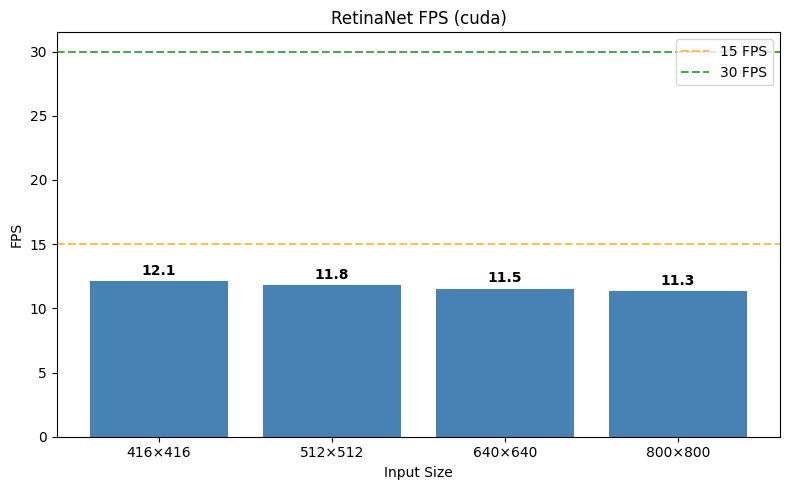

In [42]:
# ============================================================
# 9.1  FPS benchmark with proper GPU synchronization
# ============================================================

@torch.no_grad()
def benchmark_fps(model, device, input_size=640, warmup=10, iters=100):
    model.eval()
    dummy = torch.randn(3, input_size, input_size, device=device)
    # Ensure it's float [0,1]
    dummy = dummy.abs().clamp(0, 1)

    # Warmup
    print(f"  Warming up ({warmup} iters)...")
    for _ in range(warmup):
        _ = model([dummy])
        if device.type == "cuda":
            torch.cuda.synchronize()

    # Benchmark
    print(f"  Benchmarking ({iters} iters)...")
    latencies = []
    for _ in range(iters):
        if device.type == "cuda":
            torch.cuda.synchronize()
        t0 = time.perf_counter()
        _ = model([dummy])
        if device.type == "cuda":
            torch.cuda.synchronize()
        latencies.append(time.perf_counter() - t0)

    lat = np.array(latencies)
    fps = 1.0 / lat.mean()
    p95 = np.percentile(lat, 95)

    print(f"  Mean: {lat.mean()*1000:.1f}ms | P95: {p95*1000:.1f}ms | FPS: {fps:.1f}")

    if fps >= 30: print(f"  ✅ Real-time (≥30 FPS)")
    elif fps >= 15: print(f"  ⚠️ Near real-time (15-30 FPS)")
    else: print(f"  ❌ Below real-time (<15 FPS)")

    return {"mean_fps": fps, "mean_ms": lat.mean()*1000, "p95_ms": p95*1000}


print("\n" + "="*50)
print(f"FPS Benchmark ({DEVICE})")
print("="*50)

size_results = {}
for size in [416, 512, 640, 800]:
    print(f"\n--- {size}×{size} ---")
    try:
        size_results[size] = benchmark_fps(model, DEVICE, size, warmup=5, iters=50)
    except RuntimeError as e:
        if "out of memory" in str(e).lower():
            print(f"  ❌ OOM at {size}×{size}")
            torch.cuda.empty_cache()
        else:
            raise

# Plot
if size_results:
    sizes = list(size_results.keys())
    fps_vals = [size_results[s]["mean_fps"] for s in sizes]

    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(range(len(sizes)), fps_vals, color="steelblue")
    ax.set_xticks(range(len(sizes)))
    ax.set_xticklabels([f"{s}×{s}" for s in sizes])
    ax.set_xlabel("Input Size"); ax.set_ylabel("FPS")
    ax.set_title(f"RetinaNet FPS ({DEVICE})")
    ax.axhline(15, color="orange", ls="--", alpha=0.7, label="15 FPS")
    ax.axhline(30, color="green", ls="--", alpha=0.7, label="30 FPS")
    ax.legend()
    for bar, v in zip(bars, fps_vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
                f"{v:.1f}", ha="center", fontweight="bold")
    plt.tight_layout()
    plt.savefig(KAGGLE_WORKING / "fps_benchmark.png", dpi=150)
    plt.show()

---
## 10. Save & Export

In [43]:
# ============================================================
# 10.1  Save full checkpoint (for resuming training)
# ============================================================

torch.save({
    "model_state_dict": model.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "scheduler_state_dict": scheduler.state_dict(),
    "epoch": NUM_EPOCHS,
    "best_val_loss": best_val_loss,
    "history": history,
    "config": {
        "num_classes": 2,
        "input_size": INPUT_SIZE,
        "learning_rate": LEARNING_RATE,
        "batch_size": BATCH_SIZE,
    },
}, ckpt_dir / "full_checkpoint.pth")

print("💾 All outputs saved to /kaggle/working/:")
print("   checkpoints/best_model.pth     — Best weights")
print("   checkpoints/final_model.pth    — Final epoch weights")
print("   checkpoints/full_checkpoint.pth — Full state (resume training)")
print("   coco_annotations/              — Train/val JSON annotations")
print("   training_curves.png")
print("   pr_curve.png")
print("   detection_results.png")
print("   fps_benchmark.png")
print("\n📥 Download from Output tab → /kaggle/working/checkpoints/")

💾 All outputs saved to /kaggle/working/:
   checkpoints/best_model.pth     — Best weights
   checkpoints/final_model.pth    — Final epoch weights
   checkpoints/full_checkpoint.pth — Full state (resume training)
   coco_annotations/              — Train/val JSON annotations
   training_curves.png
   pr_curve.png
   detection_results.png
   fps_benchmark.png

📥 Download from Output tab → /kaggle/working/checkpoints/


In [ ]:
# ============================================================
# 10.2  Quick-start guide
# ============================================================

print("""
╔══════════════════════════════════════════════════════════════╗
║                    QUICK-START GUIDE                        ║
╠══════════════════════════════════════════════════════════════╣
║                                                              ║
║  detector = SARDetector("checkpoints/best_model.pth")        ║
║                                                              ║
║  # Single image:                                             ║
║  result = detector.detect_image("photo.jpg")                 ║
║                                                              ║
║  # Entire folder:                                            ║
║  results = detector.detect_folder("drone_footage/")          ║
║                                                              ║
║  # Tune sensitivity:                                         ║
║  detector.score_threshold = 0.3  # More recall               ║
║  detector.score_threshold = 0.7  # More precision            ║
║                                                              ║
╚══════════════════════════════════════════════════════════════╝
""")